# Lending Case Study

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from scipy import stats

%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
pd.set_option('display.max_columns', 500)

### Read the loan dataset

In [4]:
df = pd.read_csv('loan.csv')
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [5]:
pd.set_option('display.max_rows', len(df))

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [7]:
# Check the percentage of missing value in the dataframe for each column.
round((df.isnull().sum()/ len(df) )*100,2)

id                                  0.00
member_id                           0.00
loan_amnt                           0.00
funded_amnt                         0.00
funded_amnt_inv                     0.00
term                                0.00
int_rate                            0.00
installment                         0.00
grade                               0.00
sub_grade                           0.00
emp_title                           6.19
emp_length                          2.71
home_ownership                      0.00
annual_inc                          0.00
verification_status                 0.00
issue_d                             0.00
loan_status                         0.00
pymnt_plan                          0.00
url                                 0.00
desc                               32.58
purpose                             0.00
title                               0.03
zip_code                            0.00
addr_state                          0.00
dti             

- Few columns have missing values more than 90%. As these columns does not conatin much information for our analysis. So dropping the columns with missing value percentage > 90%

In [8]:
null_columns = df.columns[round((df.isnull().sum()/ len(df) )*100,2) > 90.00].tolist()
null_columns

['mths_since_last_record',
 'next_pymnt_d',
 'mths_since_last_major_derog',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_il_6m',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_recent_revol_delinq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'pct_tl_nvr_dlq',
 'percen

In [9]:
df =  df.drop(columns = null_columns)

In [10]:
round((df.isnull().sum()/ len(df) )*100, 2)

id                             0.00
member_id                      0.00
loan_amnt                      0.00
funded_amnt                    0.00
funded_amnt_inv                0.00
term                           0.00
int_rate                       0.00
installment                    0.00
grade                          0.00
sub_grade                      0.00
emp_title                      6.19
emp_length                     2.71
home_ownership                 0.00
annual_inc                     0.00
verification_status            0.00
issue_d                        0.00
loan_status                    0.00
pymnt_plan                     0.00
url                            0.00
desc                          32.58
purpose                        0.00
title                          0.03
zip_code                       0.00
addr_state                     0.00
dti                            0.00
delinq_2yrs                    0.00
earliest_cr_line               0.00
inq_last_6mths              

- Columns like deling_2yrs, revol_bal etc. are computed after giving out the loan to the customer. These variables are called customer-behaviour variables. These variables does not play a part on deciding whether a loan should be approve or rejected.
- So, dropping such columns which do not take part in decision making for loan approval.

In [11]:
df = df.drop(columns = ['delinq_2yrs','earliest_cr_line','inq_last_6mths','mths_since_last_delinq','last_pymnt_d',
                        'last_pymnt_amnt','last_credit_pull_d','collections_12_mths_ex_med','collection_recovery_fee',
                        'recoveries','total_rec_late_fee','total_rec_int','total_rec_prncp','total_pymnt_inv','total_pymnt',
                        'delinq_amnt','chargeoff_within_12_mths','acc_now_delinq',
                        'out_prncp_inv','out_prncp','revol_util','revol_bal'])

In [12]:
round((df.isnull().sum()/ len(df) )*100, 2)

id                       0.00
member_id                0.00
loan_amnt                0.00
funded_amnt              0.00
funded_amnt_inv          0.00
term                     0.00
int_rate                 0.00
installment              0.00
grade                    0.00
sub_grade                0.00
emp_title                6.19
emp_length               2.71
home_ownership           0.00
annual_inc               0.00
verification_status      0.00
issue_d                  0.00
loan_status              0.00
pymnt_plan               0.00
url                      0.00
desc                    32.58
purpose                  0.00
title                    0.03
zip_code                 0.00
addr_state               0.00
dti                      0.00
open_acc                 0.00
pub_rec                  0.00
total_acc                0.00
initial_list_status      0.00
policy_code              0.00
application_type         0.00
pub_rec_bankruptcies     1.75
tax_liens                0.10
dtype: flo

- url, member_id, id variable does not take part in anaysing the loan approval process. So dropping such columns

In [13]:
df = df.drop(columns = ['url','member_id','id'])

In [14]:
round((df.isnull().sum()/ len(df) )*100, 2)

loan_amnt                0.00
funded_amnt              0.00
funded_amnt_inv          0.00
term                     0.00
int_rate                 0.00
installment              0.00
grade                    0.00
sub_grade                0.00
emp_title                6.19
emp_length               2.71
home_ownership           0.00
annual_inc               0.00
verification_status      0.00
issue_d                  0.00
loan_status              0.00
pymnt_plan               0.00
desc                    32.58
purpose                  0.00
title                    0.03
zip_code                 0.00
addr_state               0.00
dti                      0.00
open_acc                 0.00
pub_rec                  0.00
total_acc                0.00
initial_list_status      0.00
policy_code              0.00
application_type         0.00
pub_rec_bankruptcies     1.75
tax_liens                0.10
dtype: float64

### Treating missing values

In [15]:
df['tax_liens'].value_counts()

0.0    39678
Name: tax_liens, dtype: int64

- As tax_liens contain only one value i.e. 0.0 in the entire dataset, it does not show any variation in the data. So dropping the column would not effect the decsion process of the loan approval.

In [16]:
df = df.drop(columns = ['tax_liens'])

In [17]:
round((df.isnull().sum()/ len(df) )*100, 2)

loan_amnt                0.00
funded_amnt              0.00
funded_amnt_inv          0.00
term                     0.00
int_rate                 0.00
installment              0.00
grade                    0.00
sub_grade                0.00
emp_title                6.19
emp_length               2.71
home_ownership           0.00
annual_inc               0.00
verification_status      0.00
issue_d                  0.00
loan_status              0.00
pymnt_plan               0.00
desc                    32.58
purpose                  0.00
title                    0.03
zip_code                 0.00
addr_state               0.00
dti                      0.00
open_acc                 0.00
pub_rec                  0.00
total_acc                0.00
initial_list_status      0.00
policy_code              0.00
application_type         0.00
pub_rec_bankruptcies     1.75
dtype: float64

In [18]:
df.emp_title.value_counts()

US Army                                                                           134
Bank of America                                                                   109
IBM                                                                                66
AT&T                                                                               59
Kaiser Permanente                                                                  56
USAF                                                                               54
Wells Fargo                                                                        54
UPS                                                                                53
US Air Force                                                                       52
Walmart                                                                            45
Lockheed Martin                                                                    44
United States Air Force                               

In [19]:
df[df.emp_title.isnull()]

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,desc,purpose,title,zip_code,addr_state,dti,open_acc,pub_rec,total_acc,initial_list_status,policy_code,application_type,pub_rec_bankruptcies
0,5000,5000,4975.000000,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.00,Verified,Dec-11,Fully Paid,n,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,3,0,9,f,1,INDIVIDUAL,0.0
2,2400,2400,2400.000000,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.00,Not Verified,Dec-11,Fully Paid,n,NaN,small_business,real estate business,606xx,IL,8.72,2,0,10,f,1,INDIVIDUAL,0.0
8,5600,5600,5600.000000,60 months,21.28%,152.39,F,F2,NaN,4 years,OWN,40000.00,Source Verified,Dec-11,Charged Off,n,Borrower added on 12/21/11 > I own a small h...,small_business,Expand Business & Buy Debt Portfolio,958xx,CA,5.55,11,0,13,f,1,INDIVIDUAL,0.0
30,4375,4375,4375.000000,36 months,7.51%,136.11,A,A3,NaN,7 years,MORTGAGE,17108.00,Source Verified,Dec-11,Fully Paid,n,Borrower added on 12/17/11 > This loan is a ...,debt_consolidation,Debt Consolidation,141xx,NY,20.34,6,0,12,f,1,INDIVIDUAL,0.0
42,3000,3000,3000.000000,36 months,18.25%,108.84,D,D5,NaN,9 years,MORTGAGE,65000.00,Not Verified,Dec-11,Fully Paid,n,Borrower added on 12/15/11 > Combination of ...,other,Year End Cleanup,180xx,PA,17.39,8,0,22,f,1,INDIVIDUAL,0.0
61,17500,8950,8925.000000,60 months,17.27%,223.74,D,D3,NaN,6 years,RENT,40000.00,Verified,Dec-11,Fully Paid,n,Borrower added on 11/28/11 > Thanks.<br> Bor...,small_business,Start Up,951xx,CA,19.47,5,0,6,f,1,INDIVIDUAL,0.0
110,5500,5500,5500.000000,36 months,6.62%,168.88,A,A2,NaN,8 years,MORTGAGE,110000.00,Verified,Dec-11,Fully Paid,n,Borrower added on 12/14/11 > This loan is fo...,small_business,Computer Equipment,060xx,CT,9.69,7,0,26,f,1,INDIVIDUAL,0.0
168,2500,2500,2500.000000,36 months,7.51%,77.78,A,A3,NaN,NaN,OWN,12000.00,Source Verified,Dec-11,Charged Off,n,Borrower added on 12/13/11 > TO CONSOLIDATE ...,debt_consolidation,GET FREE OF DEBT,961xx,CA,16.30,13,0,20,f,1,INDIVIDUAL,0.0
186,9000,9000,9000.000000,36 months,10.65%,293.16,B,B2,NaN,9 years,MORTGAGE,74000.00,Source Verified,Dec-11,Fully Paid,n,NaN,credit_card,Credit Card Refi,570xx,SD,8.89,7,0,10,f,1,INDIVIDUAL,0.0
199,20000,20000,20000.000000,36 months,13.49%,678.61,C,C1,NaN,6 years,RENT,75000.00,Verified,Dec-11,Fully Paid,n,NaN,debt_consolidation,LC Loan,921xx,CA,22.38,7,0,17,f,1,INDIVIDUAL,0.0


- Dropping the rows with null value of emp_title as the percentage of missing value(6.19%) is too low.

In [20]:
df = df[~df.emp_title.isnull()]

In [21]:
round((df.isnull().sum()/ len(df) )*100, 2)

loan_amnt                0.00
funded_amnt              0.00
funded_amnt_inv          0.00
term                     0.00
int_rate                 0.00
installment              0.00
grade                    0.00
sub_grade                0.00
emp_title                0.00
emp_length               0.15
home_ownership           0.00
annual_inc               0.00
verification_status      0.00
issue_d                  0.00
loan_status              0.00
pymnt_plan               0.00
desc                    32.44
purpose                  0.00
title                    0.02
zip_code                 0.00
addr_state               0.00
dti                      0.00
open_acc                 0.00
pub_rec                  0.00
total_acc                0.00
initial_list_status      0.00
policy_code              0.00
application_type         0.00
pub_rec_bankruptcies     1.76
dtype: float64

In [22]:
df[df.emp_length.isnull()]

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,desc,purpose,title,zip_code,addr_state,dti,open_acc,pub_rec,total_acc,initial_list_status,policy_code,application_type,pub_rec_bankruptcies
1674,25000,25000,24950.000000,60 months,14.27%,585.22,C,C2,Asso. Illinois Middle Schools,NaN,MORTGAGE,117000.00,Verified,Dec-11,Fully Paid,n,NaN,debt_consolidation,PersonalP,605xx,IL,12.71,12,0,39,f,1,INDIVIDUAL,0.0
1902,2500,2500,2500.000000,36 months,14.65%,86.24,C,C3,us army national guard,NaN,MORTGAGE,33600.00,Source Verified,Nov-11,Fully Paid,n,NaN,debt_consolidation,credit card consolidation,913xx,CA,18.14,10,0,22,f,1,INDIVIDUAL,0.0
2256,15000,15000,15000.000000,36 months,6.03%,456.54,A,A1,Arizona's Best Choice Pest,NaN,MORTGAGE,80000.00,Source Verified,Nov-11,Fully Paid,n,NaN,small_business,Small Business Loan,852xx,AZ,0.75,7,0,16,f,1,INDIVIDUAL,0.0
2799,11200,11200,11100.000000,36 months,6.62%,343.89,A,A2,Long Agency Inc.,NaN,RENT,52000.00,Not Verified,Nov-11,Fully Paid,n,Borrower added on 11/18/11 > replace a highe...,debt_consolidation,Free at last,145xx,NY,11.38,13,0,26,f,1,INDIVIDUAL,0.0
3458,10000,10000,10000.000000,36 months,9.91%,322.25,B,B1,Feldhaus and Peace,NaN,RENT,21600.00,Not Verified,Nov-11,Fully Paid,n,NaN,other,personal,451xx,OH,10.17,14,0,16,f,1,INDIVIDUAL,0.0
3605,6400,6400,6400.000000,36 months,8.90%,203.23,A,A5,US Army National Guard,NaN,RENT,35000.00,Source Verified,Nov-11,Fully Paid,n,Borrower added on 11/07/11 > Wedding ring lo...,wedding,Wedding Loan,857xx,AZ,18.45,4,0,5,f,1,INDIVIDUAL,0.0
3740,10000,10000,10000.000000,36 months,12.69%,335.45,B,B5,AEM Corporation,NaN,MORTGAGE,98000.00,Verified,Nov-11,Fully Paid,n,NaN,major_purchase,Montana,782xx,TX,24.12,21,0,37,f,1,INDIVIDUAL,0.0
4162,4750,4750,4750.000000,36 months,7.90%,148.63,A,A4,Jim's Northside Service,NaN,MORTGAGE,30000.00,Source Verified,Nov-11,Fully Paid,n,Borrower added on 10/25/11 > I am using this...,other,payoff loan with higher interest,557xx,MN,13.96,5,0,16,f,1,INDIVIDUAL,0.0
4738,6250,6250,6250.000000,36 months,15.27%,217.49,C,C4,Mcdonalds,NaN,RENT,14898.00,Source Verified,Oct-11,Fully Paid,n,NaN,debt_consolidation,Paying off debts,124xx,NY,7.89,2,0,16,f,1,INDIVIDUAL,0.0
5060,12000,12000,12000.000000,36 months,7.51%,373.33,A,A3,US Government,NaN,RENT,41830.08,Source Verified,Oct-11,Charged Off,n,Borrower added on 10/15/11 > I am a good bor...,credit_card,Good Loan,799xx,TX,19.56,7,0,24,f,1,INDIVIDUAL,0.0


- Dropping the rows with null value of emp_length as the percentage of missing value(0.15%) is too low.

In [23]:
df = df[~df.emp_length.isnull()]

In [24]:
round((df.isnull().sum()/ len(df) )*100, 2)

loan_amnt                0.00
funded_amnt              0.00
funded_amnt_inv          0.00
term                     0.00
int_rate                 0.00
installment              0.00
grade                    0.00
sub_grade                0.00
emp_title                0.00
emp_length               0.00
home_ownership           0.00
annual_inc               0.00
verification_status      0.00
issue_d                  0.00
loan_status              0.00
pymnt_plan               0.00
desc                    32.44
purpose                  0.00
title                    0.02
zip_code                 0.00
addr_state               0.00
dti                      0.00
open_acc                 0.00
pub_rec                  0.00
total_acc                0.00
initial_list_status      0.00
policy_code              0.00
application_type         0.00
pub_rec_bankruptcies     1.76
dtype: float64

In [25]:
df.title.value_counts()

Debt Consolidation                                                                  2089
Debt Consolidation Loan                                                             1652
Personal Loan                                                                        632
Consolidation                                                                        501
debt consolidation                                                                   473
Credit Card Consolidation                                                            340
Home Improvement                                                                     337
Debt consolidation                                                                   318
Credit Card Loan                                                                     297
Personal                                                                             290
Small Business Loan                                                                  255
Consolidation Loan   

In [26]:
df[df.title.isnull()]

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,desc,purpose,title,zip_code,addr_state,dti,open_acc,pub_rec,total_acc,initial_list_status,policy_code,application_type,pub_rec_bankruptcies
25188,8000,8000,8000.000000,36 months,19.79%,296.46,F,F5,Palm Beach County Sheriff's Office,< 1 year,RENT,41000.0,Source Verified,Sep-10,Fully Paid,n,Borrower added on 09/28/10 > I plan to use the...,other,NaN,333xx,FL,3.40,3,0,5,f,1,INDIVIDUAL,0.0
27477,20000,20000,19852.540000,60 months,16.32%,489.77,D,D5,Charles Schwab,5 years,OWN,68000.0,Source Verified,Jul-10,Fully Paid,n,Borrower added on 07/23/10 > I am going to p...,credit_card,NaN,852xx,AZ,5.93,2,0,8,f,1,INDIVIDUAL,0.0
28469,13750,13750,13750.000000,60 months,16.32%,336.72,D,D5,Dbl Labs,4 years,OWN,30000.0,Source Verified,Jul-10,Fully Paid,n,Borrower added on 06/26/10 > schooling<br/> ...,other,NaN,563xx,MN,18.84,15,0,23,f,1,INDIVIDUAL,0.0
28710,1800,1800,1800.000000,36 months,14.84%,62.26,D,D1,Fresh Produce Sportswear,6 years,OWN,30000.0,Not Verified,Jun-10,Fully Paid,n,NaN,debt_consolidation,NaN,926xx,CA,7.72,4,0,8,f,1,INDIVIDUAL,0.0
28985,24000,15200,9200.020000,60 months,17.19%,379.32,E,E3,Tulsa Public Schools,1 year,RENT,39804.0,Verified,Jun-10,Charged Off,n,Borrower added on 05/20/10 > consolidating cre...,debt_consolidation,NaN,741xx,OK,9.50,9,0,27,f,1,INDIVIDUAL,0.0
29008,1300,1300,1250.000000,36 months,13.61%,44.19,C,C2,Norman Glavas Architects,5 years,RENT,45000.0,Source Verified,Jun-10,Fully Paid,n,NaN,educational,NaN,111xx,NY,1.07,2,0,4,f,1,INDIVIDUAL,0.0
30307,5600,5600,5600.000000,36 months,11.36%,184.31,B,B5,"Jones, Foster, Johnston & Stubbs, P.A.",4 years,RENT,50000.0,Not Verified,May-10,Fully Paid,n,NaN,educational,NaN,334xx,FL,24.82,13,0,27,f,1,INDIVIDUAL,0.0
31575,8000,8000,7000.000000,36 months,7.14%,247.52,A,A3,Insight,10+ years,MORTGAGE,85000.0,Not Verified,Mar-10,Fully Paid,n,Borrower added on 03/11/10 > Had an unexpect...,debt_consolidation,NaN,754xx,TX,14.51,11,0,25,f,1,INDIVIDUAL,0.0
37809,7500,7500,2312.543323,36 months,10.95%,245.36,B,B1,hilton hotel,9 years,MORTGAGE,37000.0,Verified,Jan-09,Fully Paid,n,NaN,major_purchase,NaN,631xx,MO,14.72,13,0,28,f,1,INDIVIDUAL,0.0


- Dropping the rows with null value of title as the percentage of missing value(0.02%) is too low.

In [27]:
df = df[~df.title.isnull()]

In [28]:
round((df.isnull().sum()/ len(df) )*100, 2)

loan_amnt                0.00
funded_amnt              0.00
funded_amnt_inv          0.00
term                     0.00
int_rate                 0.00
installment              0.00
grade                    0.00
sub_grade                0.00
emp_title                0.00
emp_length               0.00
home_ownership           0.00
annual_inc               0.00
verification_status      0.00
issue_d                  0.00
loan_status              0.00
pymnt_plan               0.00
desc                    32.43
purpose                  0.00
title                    0.00
zip_code                 0.00
addr_state               0.00
dti                      0.00
open_acc                 0.00
pub_rec                  0.00
total_acc                0.00
initial_list_status      0.00
policy_code              0.00
application_type         0.00
pub_rec_bankruptcies     1.76
dtype: float64

- Drooping the column desc as this variable is not required for analysing the loan approval process.

In [29]:
df = df.drop(columns = ['desc'])

- Dropping the rows with null value of public record bankruptcies as the percentage of missing value(1.76%) is too low.

In [30]:
df = df[~df.pub_rec_bankruptcies.isnull()]

In [31]:
df.isnull().sum()

loan_amnt               0
funded_amnt             0
funded_amnt_inv         0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
pymnt_plan              0
purpose                 0
title                   0
zip_code                0
addr_state              0
dti                     0
open_acc                0
pub_rec                 0
total_acc               0
initial_list_status     0
policy_code             0
application_type        0
pub_rec_bankruptcies    0
dtype: int64

### Data understanding

In [32]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,open_acc,pub_rec,total_acc,initial_list_status,policy_code,application_type,pub_rec_bankruptcies
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,car,bike,309xx,GA,1.00,3,0,4,f,1,INDIVIDUAL,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,other,personel,917xx,CA,20.00,10,0,37,f,1,INDIVIDUAL,0.0
4,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,other,Personal,972xx,OR,17.94,15,0,38,f,1,INDIVIDUAL,0.0
5,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,Veolia Transportaton,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,n,wedding,My wedding loan I promise to pay back,852xx,AZ,11.20,9,0,12,f,1,INDIVIDUAL,0.0
6,7000,7000,7000.0,60 months,15.96%,170.08,C,C5,Southern Star Photography,8 years,RENT,47004.0,Not Verified,Dec-11,Fully Paid,n,debt_consolidation,Loan,280xx,NC,23.51,7,0,11,f,1,INDIVIDUAL,0.0


In [33]:
df.describe(include = 'all')

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,open_acc,pub_rec,total_acc,initial_list_status,policy_code,application_type,pub_rec_bankruptcies
count,36539.000000,36539.000000,36539.000000,36539,36539,36539.000000,36539,36539,36539,36539,36539,3.653900e+04,36539,36539,36539,36539,36539,36539,36539,36539,36539.000000,36539.000000,36539.000000,36539.000000,36539,36539.0,36539,36539.000000
unique,NaN,NaN,NaN,2,334,NaN,7,35,28293,11,4,NaN,3,52,3,1,14,18005,806,49,NaN,NaN,NaN,NaN,1,NaN,1,NaN
top,NaN,NaN,NaN,36 months,10.99%,NaN,B,B3,US Army,10+ years,RENT,NaN,Not Verified,Dec-11,Fully Paid,n,debt_consolidation,Debt Consolidation,100xx,CA,NaN,NaN,NaN,NaN,f,NaN,INDIVIDUAL,NaN
freq,NaN,NaN,NaN,26465,901,NaN,11048,2675,132,8416,17538,NaN,15113,2127,30455,36539,17508,2068,541,6558,NaN,NaN,NaN,NaN,36539,NaN,36539,NaN
mean,11295.186650,11021.138373,10587.158993,NaN,NaN,325.878516,NaN,NaN,NaN,NaN,NaN,6.924044e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.437993,9.342264,0.053806,22.221188,NaN,1.0,NaN,0.041490
std,7435.387965,7168.397466,7073.361756,NaN,NaN,207.431675,NaN,NaN,NaN,NaN,NaN,6.350975e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.645270,4.374560,0.235140,11.380616,NaN,0.0,NaN,0.200382
min,500.000000,500.000000,0.000000,NaN,NaN,16.080000,NaN,NaN,NaN,NaN,NaN,4.000000e+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,2.000000,0.000000,2.000000,NaN,1.0,NaN,0.000000
25%,5600.000000,5500.000000,5000.000000,NaN,NaN,168.730000,NaN,NaN,NaN,NaN,NaN,4.190200e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.350000,6.000000,0.000000,14.000000,NaN,1.0,NaN,0.000000
50%,10000.000000,10000.000000,9175.000000,NaN,NaN,282.960000,NaN,NaN,NaN,NaN,NaN,6.000000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.530000,9.000000,0.000000,21.000000,NaN,1.0,NaN,0.000000
75%,15000.000000,15000.000000,14500.000000,NaN,NaN,431.700000,NaN,NaN,NaN,NaN,NaN,8.300000e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.690000,12.000000,0.000000,29.000000,NaN,1.0,NaN,0.000000


In [34]:
df.application_type.value_counts()

INDIVIDUAL    36539
Name: application_type, dtype: int64

- As appliaction_type contain only one value i.e. 'INDIVIDUAL' in the entire dataset, it does not show any variation in the data. So dropping the column would not effect the decsion process of the loan approval.

In [35]:
df = df.drop(columns = ['application_type'])

In [36]:
df.policy_code.value_counts()

1    36539
Name: policy_code, dtype: int64

- As policy_code contain only one value i.e. '1' in the entire dataset, it does not show any variation in the data. So dropping the column would not effect the decsion process of the loan approval.

In [37]:
df = df.drop(columns = ['policy_code'])

In [38]:
df['initial_list_status'].value_counts()

f    36539
Name: initial_list_status, dtype: int64

- As initial_list_status contain only one value i.e. f in the entire dataset, it does not show any variation in the data. So dropping the column would not effect the decsion process of the loan approval.

In [39]:
df = df.drop(columns = ['initial_list_status'])

In [40]:
df.pymnt_plan.value_counts()

n    36539
Name: pymnt_plan, dtype: int64

- As pymnt_plan contain only one value i.e. 'n' in the entire dataset, it does not show any variation in the data. So dropping the column would not effect the decsion process of the loan approval.

In [41]:
df = df.drop(columns = ['pymnt_plan'])

In [42]:
df['int_rate'].value_counts()

10.99%    901
13.49%    787
11.49%    772
7.51%     732
7.88%     674
7.49%     616
11.71%    573
9.99%     567
7.90%     537
5.42%     505
11.99%    503
12.69%    468
10.37%    433
8.49%     418
12.42%    417
12.99%    409
10.65%    404
6.03%     399
5.79%     380
14.27%    369
8.90%     366
11.86%    365
7.29%     363
9.63%     360
6.62%     358
10.59%    336
9.91%     336
7.14%     315
5.99%     314
11.11%    313
6.99%     311
16.77%    308
12.53%    307
6.54%     295
10.74%    294
13.61%    284
6.91%     282
13.98%    271
8.94%     269
15.99%    268
7.66%     264
13.23%    252
13.99%    247
11.12%    237
10.00%    236
12.68%    235
10.36%    235
11.36%    235
10.75%    233
6.17%     231
16.49%    228
18.25%    215
10.62%    210
10.38%    209
13.06%    207
14.65%    206
10.25%    204
11.83%    202
14.96%    199
15.23%    199
16.89%    198
15.65%    196
15.95%    194
12.18%    190
15.27%    187
17.27%    187
6.92%     186
11.14%    185
16.32%    185
15.21%    180
17.49%    179
14.79%

- int_rate has '%' symbol along with the rate which makes the variable type as object. So, dropping the % sign to convert the variable to integer type for numerical analysis.

In [43]:
df['int_rate'] = df['int_rate'].apply(lambda x: x.strip('%'))

In [44]:
df.int_rate.value_counts()

10.99    901
13.49    787
11.49    772
7.51     732
7.88     674
7.49     616
11.71    573
9.99     567
7.90     537
5.42     505
11.99    503
12.69    468
10.37    433
8.49     418
12.42    417
12.99    409
10.65    404
6.03     399
5.79     380
14.27    369
8.90     366
11.86    365
7.29     363
9.63     360
6.62     358
10.59    336
9.91     336
7.14     315
5.99     314
11.11    313
6.99     311
16.77    308
12.53    307
6.54     295
10.74    294
13.61    284
6.91     282
13.98    271
8.94     269
15.99    268
7.66     264
13.23    252
13.99    247
11.12    237
10.00    236
10.36    235
11.36    235
12.68    235
10.75    233
6.17     231
16.49    228
18.25    215
10.62    210
10.38    209
13.06    207
14.65    206
10.25    204
11.83    202
14.96    199
15.23    199
16.89    198
15.65    196
15.95    194
12.18    190
17.27    187
15.27    187
6.92     186
11.14    185
16.32    185
15.21    180
17.49    179
14.79    178
9.32     178
15.58    177
15.96    176
17.58    173
9.62     171

In [45]:
df.int_rate.dtype

dtype('O')

In [46]:
# converting the data type to float of int_rate.
df.int_rate = df.int_rate.astype('float64')

In [47]:
df.emp_length.value_counts()

10+ years    8416
2 years      4189
< 1 year     4070
3 years      3925
4 years      3310
5 years      3142
1 year       3041
6 years      2125
7 years      1701
8 years      1410
9 years      1210
Name: emp_length, dtype: int64

- Converting the emp_length from object to int.

In [48]:
df['emp_length'] = df['emp_length'].apply(lambda x: x.strip('years'))

In [49]:
df.emp_length.value_counts()

10+     8416
2       4189
< 1     4070
3       3925
4       3310
5       3142
1       3041
6       2125
7       1701
8       1410
9       1210
Name: emp_length, dtype: int64

In [50]:
df.emp_length = df['emp_length'].apply(lambda x: x.replace('< 1','0'))

In [51]:
df.emp_length.value_counts()

10+     8416
2       4189
0       4070
3       3925
4       3310
5       3142
1       3041
6       2125
7       1701
8       1410
9       1210
Name: emp_length, dtype: int64

In [52]:
df.emp_length = df['emp_length'].apply(lambda x: x.replace('+',''))

In [53]:
df.emp_length.value_counts()

10     8416
2      4189
0      4070
3      3925
4      3310
5      3142
1      3041
6      2125
7      1701
8      1410
9      1210
Name: emp_length, dtype: int64

In [54]:
df.emp_length.dtype

dtype('O')

In [55]:
df.emp_length = df.emp_length.astype('int32')

In [56]:
df.emp_length.dtype

dtype('int32')

In [57]:
df.term.value_counts()

 36 months    26465
 60 months    10074
Name: term, dtype: int64

- Extarcting only the numeric value of the term

In [58]:
df.term = df.term.apply(lambda x: x.strip(' months'))

In [59]:
df.term.dtype

dtype('O')

In [60]:
df.term.value_counts()

36    26465
60    10074
Name: term, dtype: int64

In [61]:
df.loan_amnt.describe()

count    36539.000000
mean     11295.186650
std       7435.387965
min        500.000000
25%       5600.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [62]:
df.loan_status.value_counts()

Fully Paid     30455
Charged Off     5018
Current         1066
Name: loan_status, dtype: int64

- Target varaible is 'loan_status' as it holds the value which determine whether the borower was a defaulter or not based on the loan status paid or not.
- loan status as current are neither fully paid nor defaulted. So, dropping the rows with the loan_status as 'current'.
- Convert the category to numerical variable for analysis purpose.
 - Cherged off (Defaulter)- 1
 - Fully Paid (Not Defaulter) - 0

In [63]:
df = df[df.loan_status != "Current"]

In [64]:
df.loan_status.value_counts()

Fully Paid     30455
Charged Off     5018
Name: loan_status, dtype: int64

In [65]:
df["loan_status"] = np.where(df["loan_status"].str.contains("Charged Off"), 1, 0)

In [66]:
df.loan_status.value_counts()

0    30455
1     5018
Name: loan_status, dtype: int64

In [67]:
df['loan_inc_ratio'] = df.funded_amnt*100/df.annual_inc

- Extracting the year from the issue date.

In [68]:
df['year'] = df.issue_d.apply(lambda x: '20' + x.split('-')[-1])

In [69]:
df.describe(include = 'all')

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,open_acc,pub_rec,total_acc,pub_rec_bankruptcies,loan_inc_ratio,year
count,35473.000000,35473.000000,35473.000000,35473,35473.000000,35473.000000,35473,35473,35473,35473.000000,35473,3.547300e+04,35473,35473,35473.00000,35473,35473,35473,35473,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000,35473
unique,NaN,NaN,NaN,2,NaN,NaN,7,35,27500,NaN,4,NaN,3,52,NaN,14,17713,805,49,NaN,NaN,NaN,NaN,NaN,NaN,5
top,NaN,NaN,NaN,36,NaN,NaN,B,A4,US Army,NaN,RENT,NaN,Not Verified,Dec-11,NaN,debt_consolidation,Debt Consolidation,100xx,CA,NaN,NaN,NaN,NaN,NaN,NaN,2011
freq,NaN,NaN,NaN,26465,NaN,NaN,10731,2662,129,NaN,17139,NaN,14897,1918,NaN,16949,1979,527,6418,NaN,NaN,NaN,NaN,NaN,NaN,19131
mean,11120.724918,10854.975615,10413.052139,NaN,11.991532,323.733254,NaN,NaN,NaN,4.979816,NaN,6.902988e+04,NaN,NaN,0.14146,NaN,NaN,NaN,NaN,13.397759,9.322442,0.054238,22.183886,0.041750,18.156306,NaN
std,7327.854809,7071.598592,6968.841593,NaN,3.703678,207.189601,NaN,NaN,NaN,3.536441,NaN,6.393211e+04,NaN,NaN,0.34850,NaN,NaN,NaN,NaN,6.638545,4.375740,0.235880,11.406918,0.200724,11.131636,NaN
min,500.000000,500.000000,0.000000,NaN,5.420000,16.080000,NaN,NaN,NaN,0.000000,NaN,4.000000e+03,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,0.000000,2.000000,0.000000,2.000000,0.000000,0.078947,NaN
25%,5500.000000,5425.000000,5000.000000,NaN,8.940000,167.730000,NaN,NaN,NaN,2.000000,NaN,4.128000e+04,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,8.310000,6.000000,0.000000,14.000000,0.000000,9.649123,NaN
50%,10000.000000,9600.000000,9000.000000,NaN,11.860000,280.010000,NaN,NaN,NaN,4.000000,NaN,6.000000e+04,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,13.500000,9.000000,0.000000,21.000000,0.000000,16.000000,NaN
75%,15000.000000,15000.000000,14276.431140,NaN,14.540000,426.470000,NaN,NaN,NaN,9.000000,NaN,8.230500e+04,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,18.640000,12.000000,0.000000,29.000000,0.000000,24.444444,NaN


#### Handling Outliers

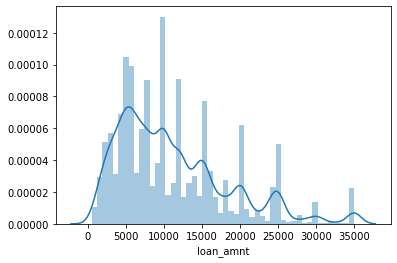

In [70]:
sb.distplot(df.loan_amnt)

In [71]:
df[((stats.zscore(df.loan_amnt) <= -3) | (stats.zscore(df.loan_amnt) >= 3))]

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,open_acc,pub_rec,total_acc,pub_rec_bankruptcies,loan_inc_ratio,year
80,35000,22075,22050.000000,60,17.27,551.84,D,D3,tutor Per ini Corporation,3,MORTGAGE,150000.00,Verified,Dec-11,0,home_improvement,Home improvement,115xx,NY,7.51,11,0,31,0.0,14.716667,2011
128,35000,35000,35000.000000,36,8.90,1111.37,A,A5,City of Los Angeles,6,MORTGAGE,125000.00,Verified,Dec-11,0,debt_consolidation,Debt Consolidation,928xx,CA,22.71,8,0,32,0.0,28.000000,2011
185,35000,35000,35000.000000,36,10.65,1140.07,B,B2,baylor college of medicine,2,MORTGAGE,168000.00,Verified,Dec-11,0,debt_consolidation,pertsonal loan,775xx,TX,3.17,16,0,22,0.0,20.833333,2011
268,35000,26825,26800.000000,60,18.64,690.56,E,E1,"Navistar, Inc.",8,MORTGAGE,85000.00,Verified,Dec-11,0,debt_consolidation,Debt Consolidation,604xx,IL,12.00,16,0,50,0.0,31.558824,2011
276,35000,35000,35000.000000,36,8.90,1111.37,A,A5,Twitch LLC,5,RENT,85000.00,Verified,Dec-11,0,debt_consolidation,debt consolidation..,606xx,IL,17.73,7,0,13,0.0,41.176471,2011
306,35000,23250,23200.000000,60,20.30,619.88,E,E5,Prospect Transportation Inc.,5,RENT,85000.00,Verified,Dec-11,0,debt_consolidation,Credit Cards Payoff,076xx,NJ,20.16,11,0,24,0.0,27.352941,2011
336,35000,23150,21739.748130,60,17.27,578.71,D,D3,Fed Govt-Environmental Protection Agency,8,MORTGAGE,208000.00,Source Verified,Dec-11,0,debt_consolidation,Debt Consolidation,207xx,MD,7.94,11,0,79,0.0,11.129808,2011
387,35000,27575,26043.432490,60,12.42,619.26,B,B4,United States Air Force,9,MORTGAGE,105000.00,Verified,Dec-11,0,home_improvement,Home Improvement Loan,782xx,TX,16.53,9,0,38,0.0,26.261905,2011
430,33425,20675,19010.821220,60,13.49,475.63,C,C1,Travelers insurance,2,MORTGAGE,75000.00,Source Verified,Dec-11,1,debt_consolidation,Debt Consolidation Loan,114xx,NY,25.71,10,0,43,0.0,27.566667,2011
496,35000,23250,23225.000000,60,20.30,619.88,E,E5,The Crexent Business Centers,3,OWN,85000.00,Verified,Dec-11,1,debt_consolidation,FREEDOM debt,322xx,FL,16.39,10,0,40,0.0,27.352941,2011


- Dropping the rows with zscoe greater than 3 and less than -3 as they are too away from the mean resulting in the outliers.

In [72]:
df = df[~((stats.zscore(df.loan_amnt) <= -3) | (stats.zscore(df.loan_amnt) >= 3))]

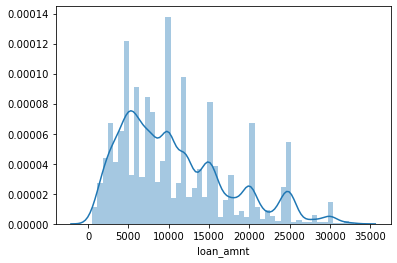

In [73]:
sb.distplot(df.loan_amnt)

### Univariate analysis

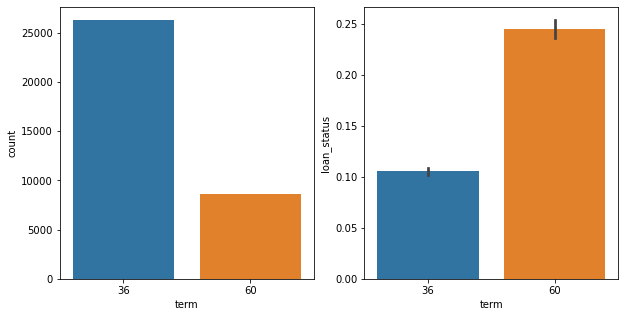

In [74]:
plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
sb.countplot(x='term', data = df)

plt.subplot(1,2,2)
sb.barplot(df.term, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b> 
   - Most of the loans have term plan of 36 months.
   - Borrowers with 60 months term plan have higher defaulter rate. Therefore most defaulters have a term plan of 60 months 

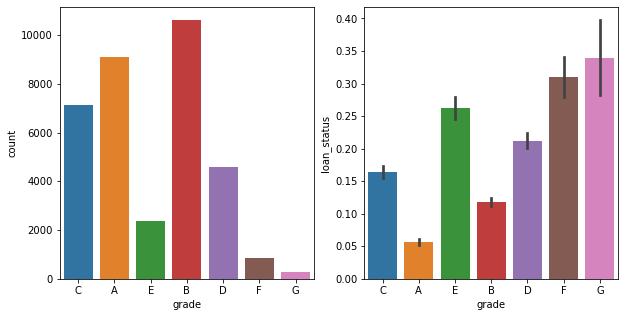

In [75]:
plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
sb.countplot(x='grade', data = df)

plt.subplot(1,2,2)
sb.barplot(df.grade, df.loan_status, estimator = np.mean)

plt.show()

<b>Inference</b>
   - Most of the loans have grade of A and B. Therefore stating most of the loans are high graded loans
   - Borrowers with grades F and G are more likely to be a deafaulter with higher defaulter rate.
   - Borrowers with grades A is least likely to be a defaulter.

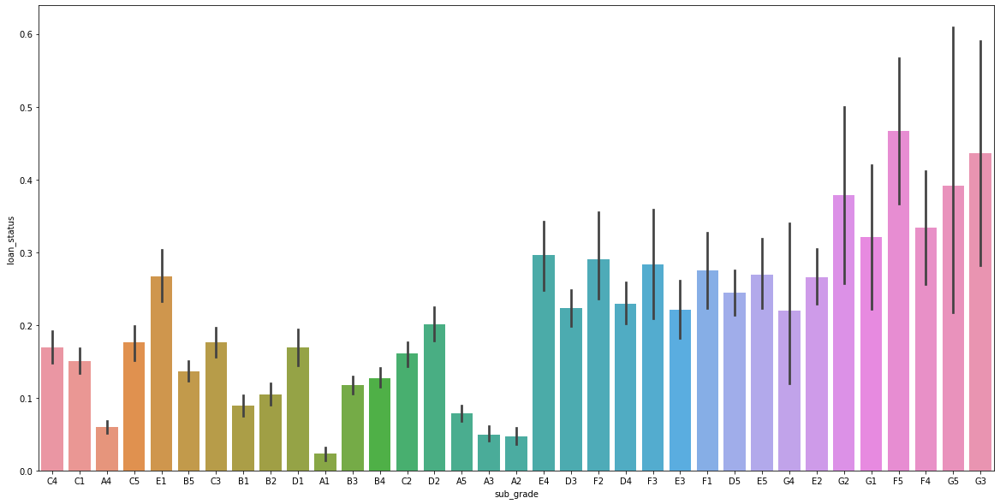

In [76]:
plt.figure(figsize=[20,10])
sb.barplot(df.sub_grade, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b>
   - Borrowers with sub_grade F5 is the most likely to be a defaulter.
   - Borrowers with sub_grade A1 is least likely to a defaulter.
   - Borrowers with sub_grade G3, G5, G2 are also have a high chance of being a defaulter.

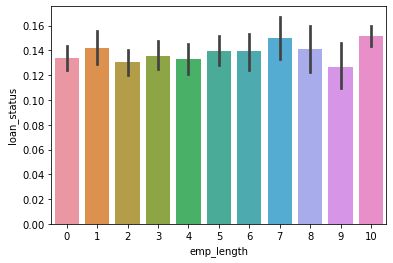

In [77]:
sb.barplot(df.emp_length, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b>
   - There is not much difference in the defaulter rate with different emp_length. So we cannot infer about a defaulter with the emp_length.

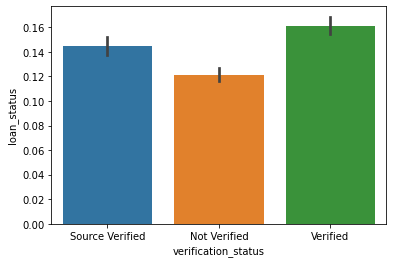

In [78]:
sb.barplot(df.verification_status, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b>
   - There is not much difference in the defaulter rate with different verification_status. So we cannot infer about a defaulter with the verification_status.

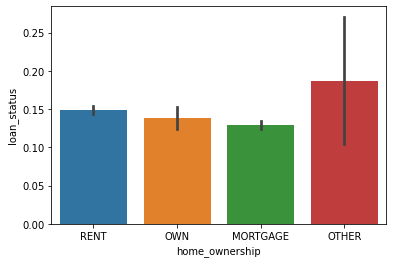

In [79]:
sb.barplot(df.home_ownership, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b>
   - Similarly in the case of home_ownership, there is not much significance difference in the defaulter rate.

In [80]:
df['int_rate'].value_counts()

10.99    846
7.51     732
11.49    731
13.49    683
7.88     674
7.49     608
9.99     551
7.90     516
11.71    507
5.42     505
11.99    446
10.37    424
12.69    418
8.49     404
6.03     399
5.79     380
10.65    369
12.99    369
11.86    365
12.42    364
7.29     362
9.63     358
6.62     358
8.90     336
9.91     317
10.59    317
7.14     315
5.99     314
6.99     311
11.11    310
12.53    307
14.27    306
6.54     295
10.74    292
13.61    284
6.91     282
13.98    271
8.94     269
16.77    269
7.66     263
13.23    252
11.12    237
10.36    235
11.36    235
10.00    234
10.75    233
15.99    233
6.17     231
12.68    227
13.99    226
10.62    210
10.38    209
10.25    204
11.83    202
13.06    201
14.96    199
16.49    194
15.95    194
12.18    190
15.65    190
6.92     186
11.14    185
18.25    185
16.32    185
14.65    183
15.21    180
9.32     178
15.58    177
15.23    173
9.62     171
15.27    171
13.11    170
11.48    170
12.73    168
8.59     168
9.88     167
12.21    166

In [81]:
df.int_rate.describe()

count    34892.000000
mean        11.928063
std          3.665749
min          5.420000
25%          8.940000
50%         11.830000
75%         14.420000
max         24.400000
Name: int_rate, dtype: float64

In [82]:
df['int_rate_bucket'] = pd.qcut(df.int_rate, [0, 0.2, 0.4, 0.6, 0.8, 1], ['Very low', 'low', 'Medium', 'High', 'Very high'])

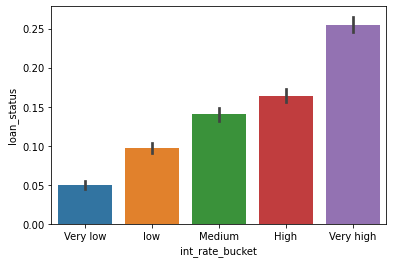

In [83]:
sb.barplot(df.int_rate_bucket, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b>
   - From the abpve graph, we can infer that as the interest rate increases so are the chances of being a defaulter.
   - Less interest rate results in less defaulters.

In [84]:
df['annual_inc_bucket'] = pd.qcut(df.annual_inc, [0, 0.2, 0.4, 0.6, 0.8, 1], ['Very low', 'low', 'Medium', 'High', 'Very high'])

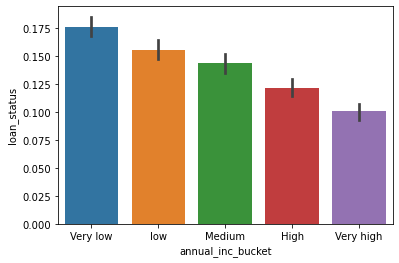

In [85]:
sb.barplot(df.annual_inc_bucket, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b>
- In the case of annual income, we can see that the low annual income results in more chances of being a defaulter than the person with higher income.

In [86]:
df['loan_amnt_bucket'] = pd.qcut(df.loan_amnt, [0, 0.2, 0.4, 0.6, 0.8, 1], ['Very low', 'low', 'Medium', 'High', 'Very high'])

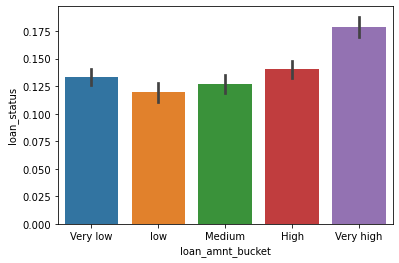

In [87]:
sb.barplot(df.loan_amnt_bucket, df.loan_status, estimator = np.mean)
plt.show()

<b>Inference</b>
   - In case of loan amount, there is no trend that on increasing the loan amount, the chances of being a defaulter is more.

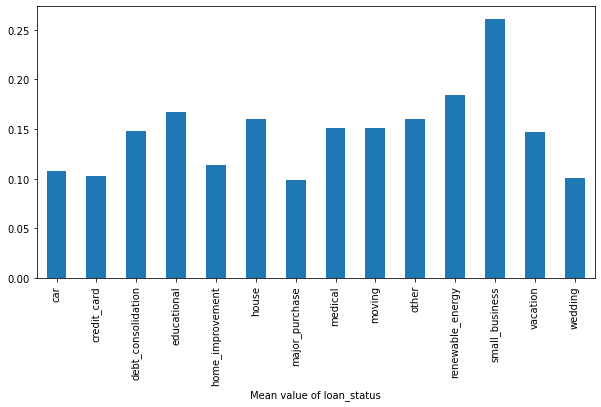

In [88]:
plt.figure(figsize=[10,5])
df.groupby(['purpose'])['loan_status'].mean().plot(kind = 'bar')
plt.xlabel('Mean value of loan_status')
plt.show()

<b>Inference</b>
- Borrowers with the purpose of loan as small_business have more chances of being a defaulter. 

In [89]:
df.year.value_counts()

2011    18550
2010    10828
2009     4447
2008     1061
2007        6
Name: year, dtype: int64

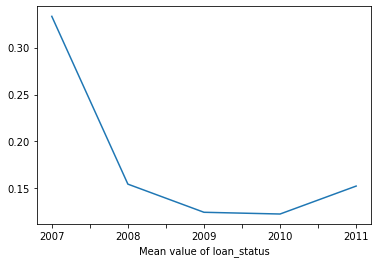

In [90]:
df.groupby(['year'])['loan_status'].mean().plot()
plt.xlabel('Mean value of loan_status')
plt.show()

<b>Inference</b>
- For year 2009 and 2010, the defaulter rate is low.
- For year 2007, the defaulter rate is the highest.
- There is no particular trend which indicates the deafulter rate with the year of the issue of the loan.

### Bivariate Analysis

In [91]:
df.groupby(['grade','sub_grade'])['int_rate'].mean()

grade  sub_grade
A      A1            5.799124
       A2            6.362078
       A3            7.150576
       A4            7.654816
       A5            8.259919
B      B1           10.026772
       B2           10.508259
       B3           10.993608
       B4           11.406857
       B5           11.786766
C      C1           12.888945
       C2           13.361430
       C3           13.690920
       C4           14.095233
       C5           14.521882
D      D1           14.920863
       D2           15.345255
       D3           15.728902
       D4           16.149543
       D5           16.604671
E      E1           16.926575
       E2           17.376211
       E3           17.699342
       E4           18.178598
       E5           18.594303
F      F1           19.029108
       F2           19.290000
       F3           19.957770
       F4           20.217674
       F5           20.603889
G      G1           20.830123
       G2           20.972727
       G3           21.

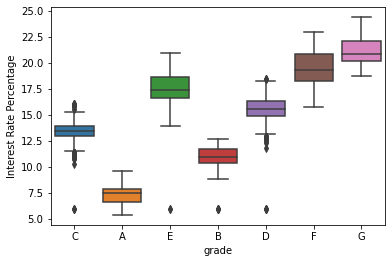

In [92]:
sb.boxplot(y='int_rate', x='grade', data=df)
plt.ylabel('Interest Rate Percentage')
plt.show()

<b>Inference</b>
- As we can see that as the garde goes down i.e. from A to G, along with the sub-grades, the interst rate increases.

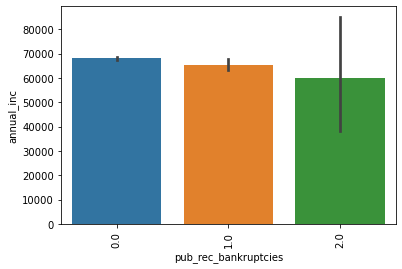

In [93]:
sb.barplot(y='annual_inc', x='pub_rec_bankruptcies', data=df)
plt.xticks(rotation=90)
plt.show()

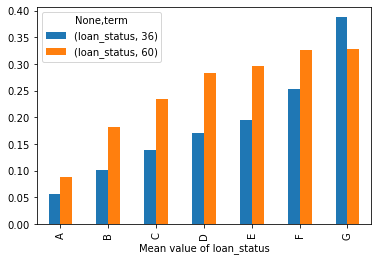

In [94]:
pd.pivot_table(df, index = df['grade'], values = ['loan_status'],  columns = df['term'], aggfunc = np.mean).plot(kind = 'bar')
plt.xlabel('Mean value of loan_status')
plt.show()

<b>Inference</b>
- For a term of 36 months, Grade G borrowers are most likely to be a deafulter.
- For a term of 60 months, Grade F and G borrowers are the most likely to be a defaulter.

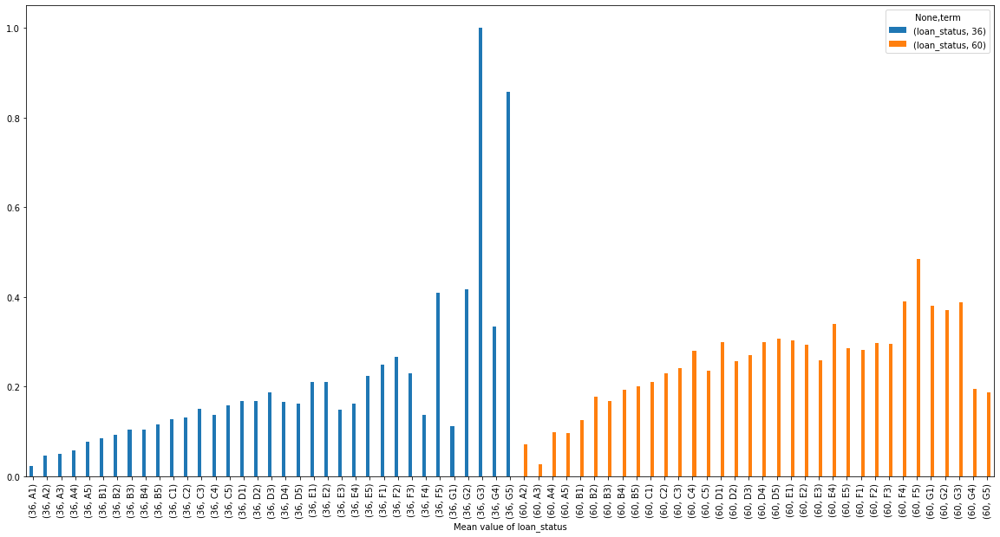

In [95]:
pd.pivot_table(df, index = df[['term', 'sub_grade']], values = ['loan_status'], 
               columns = df['term'], aggfunc = np.mean).plot(kind = 'bar', figsize=[20,10])
plt.xlabel('Mean value of loan_status')
plt.show()

<b>Inference</b>
- For 36 months term plan, G3 and G5 are more likely to be a defaulter
- For 60 months term plan, F5 is most likely to be defaulter.

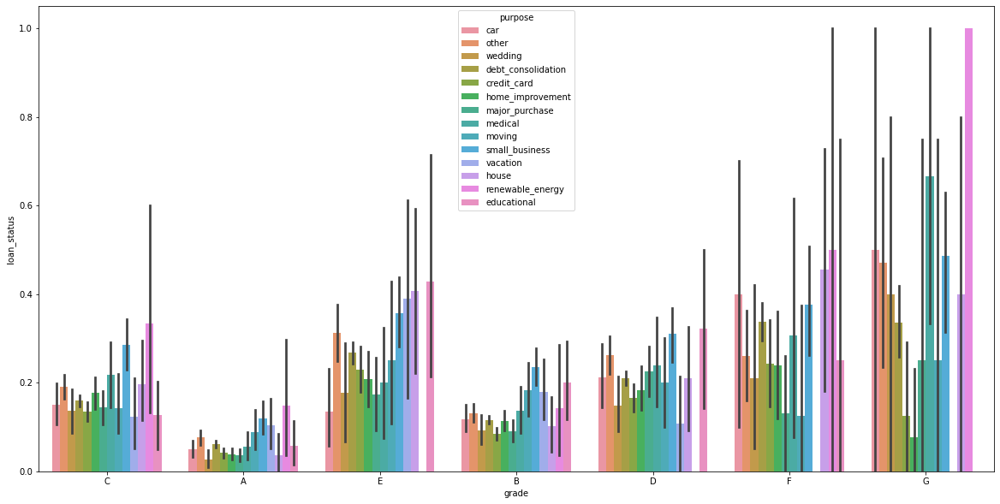

In [96]:
plt.figure(figsize = [20,10])
sb.barplot(x='grade', y='loan_status', hue='purpose', data = df)
plt.show()

<b>Inference</b>
- Borrowers with grade G and pupose as renewable energy loan are most likely to be a defaulter.

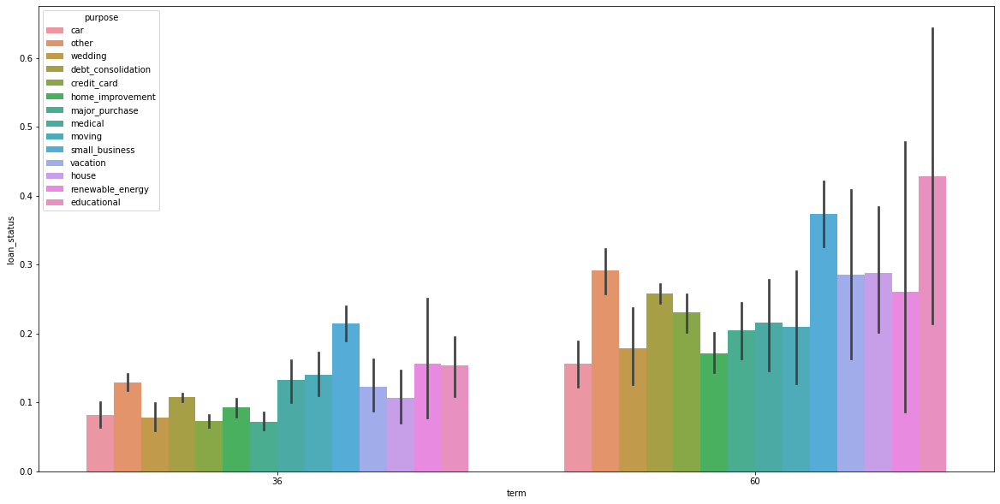

In [97]:
plt.figure(figsize = [20,10])
sb.barplot(x='term', y='loan_status', hue='purpose', data = df)
plt.show()

<b>Inference</b>
- Borrowers with 60 month term plan and educational loan are more likely to be a defaulter.

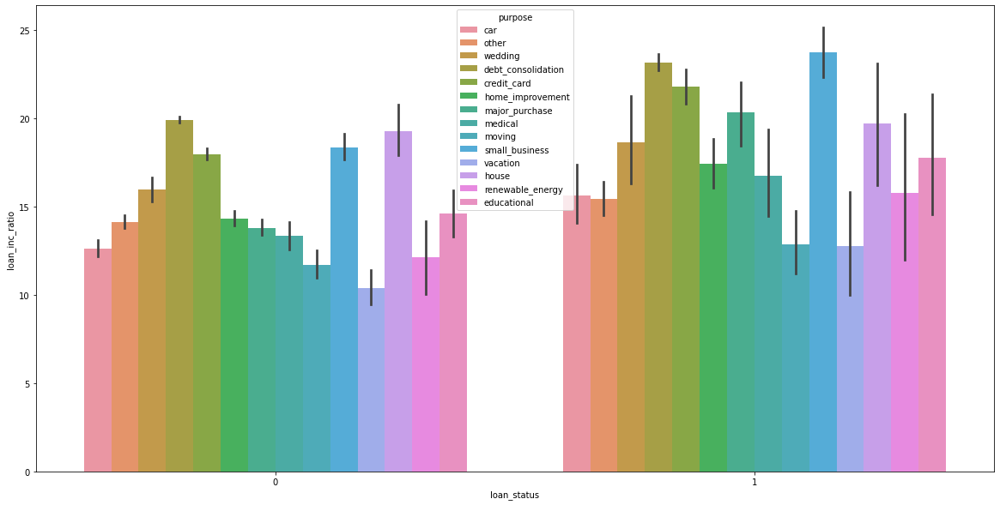

In [98]:
plt.figure(figsize = [20,10])
sb.barplot(x='loan_status', y='loan_inc_ratio', hue='purpose', data = df)
plt.show()

<b>Inference</b>
- Loans for small business have highest chances of being a defaulter.

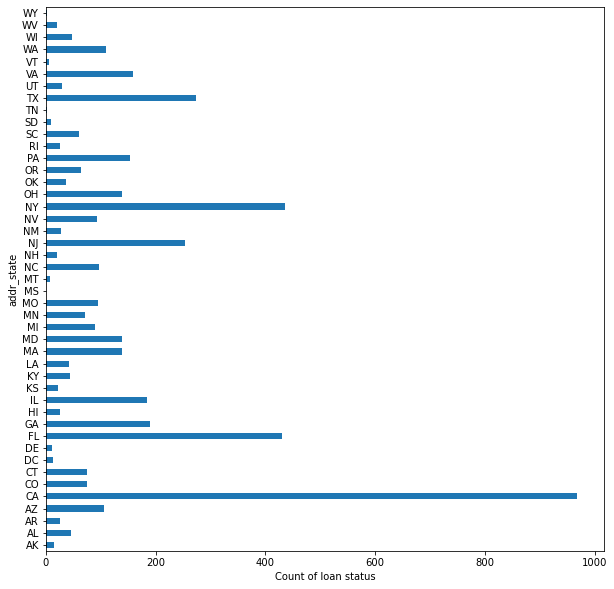

In [99]:
plt.figure(figsize=(10,10))
df[df.loan_status == 1].groupby(['addr_state'])['loan_status'].count().plot(kind = 'barh', x='loan_status', y = 'addr_state')
plt.xlabel('Count of loan status')
plt.show()

<b>Inference</b> 
- Applicants from the state CA are having high probability to be default

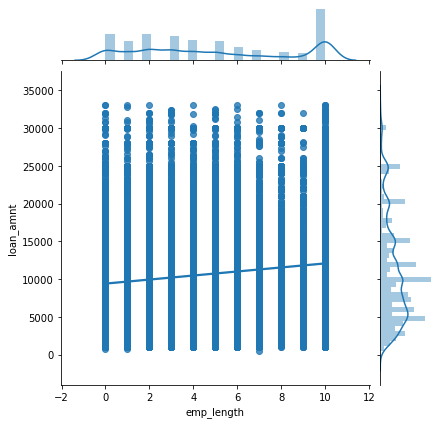

In [100]:
sb.jointplot('emp_length', 'loan_amnt', data = df, kind = 'reg')
plt.show()

<b>Inference</b>
- There was no definete pattern observed with loan amount and employment length.

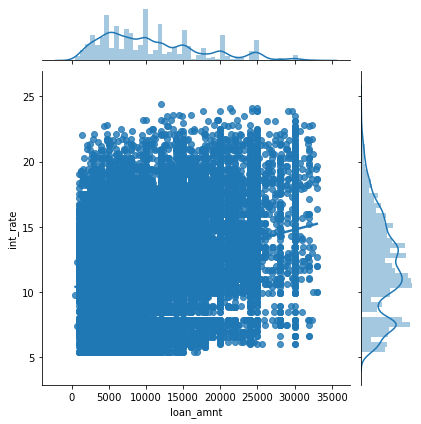

In [101]:
sb.jointplot("loan_amnt", "int_rate", data = df, kind = 'reg')
plt.show()

<b>Inference</b>
- There was no definete pattern observed with loan amount and interest rate.

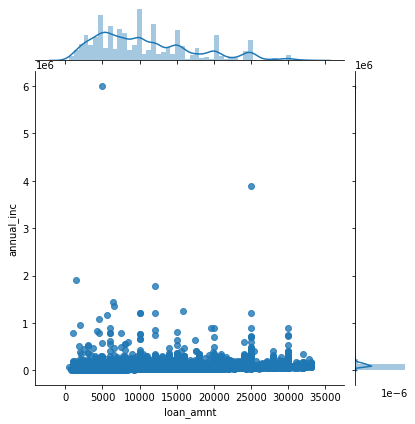

In [102]:
sb.jointplot('loan_amnt', 'annual_inc', data = df, kind = 'reg')
plt.show()

<b>Inference</b>
- There was no definete pattern observed with loan amount and annual income.

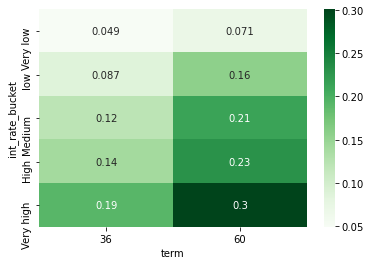

In [103]:
sb.heatmap(pd.pivot_table(data= df, index='int_rate_bucket', columns = 'term', values='loan_status', aggfunc = np.mean),
           cmap='Greens', annot = True)
plt.show()

<b>Inference</b>
-  We can observer from the graph that cutomers with 60 month term plan and very high interest rate are most likely to be a defaulter.

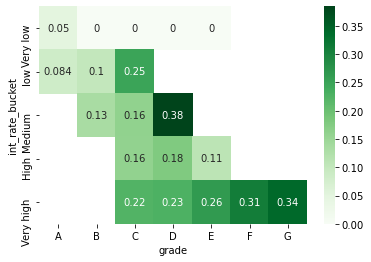

In [104]:
sb.heatmap(pd.pivot_table(data= df, index='int_rate_bucket', columns = 'grade', values='loan_status', aggfunc = np.mean),
           cmap='Greens', annot = True)
plt.show()

<b>Inference</b>
- We can observer from the graph that cutomers with grade F and high interest rate are most likely to be a defaulter.

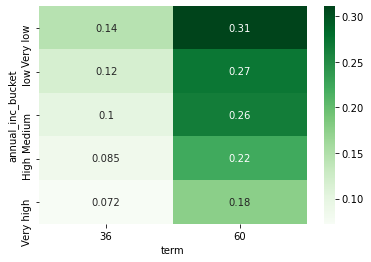

In [105]:
sb.heatmap(pd.pivot_table(data= df, index='annual_inc_bucket', columns = 'term', values='loan_status', aggfunc = np.mean),
           cmap='Greens', annot = True)
plt.show()

<b>Inference</b>
- We can observer from the graph that cutomers with 60 month term plan more likely to be a defaulter than the customers with 30 month term plan irrespective of the annual income.

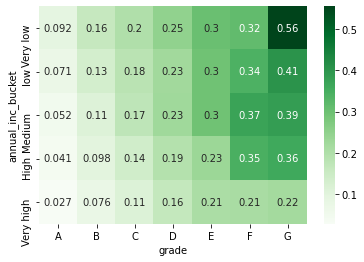

In [106]:
sb.heatmap(pd.pivot_table(data= df, index='annual_inc_bucket', columns = 'grade', values='loan_status', aggfunc = np.mean),
           cmap='Greens', annot = True)
plt.show()

<b>Inference</b>
-  We can observer from the graph that cutomers grade G are more likely to be a defaulter than any other grade irrespective of the annual income.

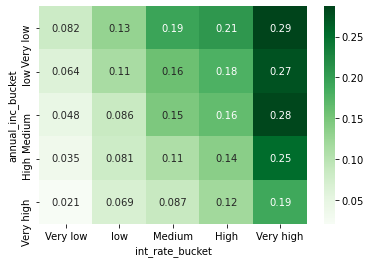

In [107]:
sb.heatmap(pd.pivot_table(data= df, index='annual_inc_bucket', columns = 'int_rate_bucket', values='loan_status',
                          aggfunc = np.mean),cmap='Greens', annot = True)
plt.show()

<b>Inference</b>
-  We can observer from the graph that cutomers very high interest rate are more likely to be a defaulter irrespective of the annual income.

In [108]:
df.groupby(['grade'])['loan_status'].mean()

grade
A    0.056886
B    0.117348
C    0.164534
D    0.212253
E    0.262733
F    0.309893
G    0.339768
Name: loan_status, dtype: float64

In [109]:
df.groupby(['grade'])['loan_status'].mean().max() - df.groupby(['grade'])['loan_status'].mean().min()

0.2828827698144632

In [110]:
df.groupby(['term'])['loan_status'].mean()

term
36    0.105445
60    0.245248
Name: loan_status, dtype: float64

In [111]:
df.groupby(['term'])['loan_status'].mean().max() - df.groupby(['term'])['loan_status'].mean().min()

0.13980266388795676

In [112]:
df.groupby(['int_rate_bucket'])['loan_status'].mean()

int_rate_bucket
Very low     0.049897
low          0.097247
Medium       0.140418
High         0.163974
Very high    0.255036
Name: loan_status, dtype: float64

In [113]:
df.groupby(['int_rate_bucket'])['loan_status'].mean().max() - df.groupby(['int_rate_bucket'])['loan_status'].mean().min()

0.205138312245079

- The difference in defaulter rate is the maximum for grade, so grade ca be best predictor for analysing the customer is defaulter or not.
- As interest rate depends on grade i.e. higher the grade, higher the interest rate, So we can also analyse that the customer is more likely to be a defaulter through interst rate.
- Term has less information content than grade and interest rate, but term and grade collectively be used to analyse a defaulter.
- Annual income and employment length of the customer plays a very less role in determinig the defaulter categorgy.